En este notebook se realiza toda la lectura del dataset, entrenamiento y test del modelo DL para colorización.

In [371]:
# Importar librerías necesarias 

import os
import torch
from torch.utils.data import Dataset, DataLoader, Subset
import random
from PIL import Image
import numpy as np
from torchvision import transforms
from torchvision.models import vgg16
import torch.nn.functional as F
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt
from torch import nn, optim
import time
from tqdm import tqdm

In [372]:
torch.cuda.empty_cache()

In [373]:
# Elegir el dispositivo adecuado 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [374]:
# Cargamos el dataset desde local 
# Nos quedamos solo con el 50% de las imágenes porque nuestro modelo es robusto ante pocos datos

# Tamaño de la imagen
SIZE = 256  
percentage=100

# Definir la clase del Dataset
class ImageFolderDataset(Dataset):
    def __init__(self, root_dir, transform=None, split='train', percentage=50):
        """
        :param root_dir: Ruta a la carpeta que contiene las imágenes.
        :param transform: Transformaciones de PyTorch.
        :param split: 'train', 'val', 'test', 'calibration'
        :param percentage: Porcentaje de imágenes a usar (ejemplo: 50%).
        """
        self.root_dir = root_dir
        self.transform = transform
        self.split = split

        # Listar todos los archivos de imagen en la carpeta
        self.image_paths = [os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

        # Ordenar y mezclar aleatoriamente
        random.shuffle(self.image_paths)

        # Reducir el dataset según el porcentaje deseado
        total_images = len(self.image_paths)
        reduced_size = int(total_images * (percentage / 100))
        self.image_paths = self.image_paths[:reduced_size]

        print(f"Tamaño del dataset original: {total_images}")
        print(f"Tamaño del dataset reducido: {len(self.image_paths)}")

        # Definir transformaciones (Flip solo en train)
        if self.split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE), Image.BICUBIC),
                transforms.RandomHorizontalFlip(),  # SOLO en train
                transforms.ToTensor(),
            ])
        else:
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE), Image.BICUBIC),
                transforms.ToTensor(),
            ])

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transforms:
            image = self.transforms(image)

        # Convert to LAB and process channels
        img_np = image.permute(1, 2, 0).numpy()  # (H, W, C)
        img_lab = rgb2lab(img_np).astype("float32")
        img_lab = transforms.ToTensor()(img_lab)  # (3, H, W)

        # Ensure L channel has correct dimensions (1, H, W)
        L = img_lab[0:1, ...] / 50. - 1.  # Keep as single channel with [0:1] slicing
        ab = img_lab[1:, ...] / 110.

        return {'L': L, 'ab': ab}

    def __len__(self):
        return len(self.image_paths)

# Definir la función para dividir en subconjuntos
def split_dataset(dataset, train_ratio=0.6, val_ratio=0.2, test_ratio=0.1):
    dataset_size = len(dataset)
    indices = list(range(dataset_size))
    random.shuffle(indices)

    train_size = int(train_ratio * dataset_size)
    val_size = int(val_ratio * dataset_size)
    test_size = int(test_ratio * dataset_size)
    calibration_size = dataset_size - (train_size + val_size + test_size)

    train_indices = indices[:train_size]
    val_indices = indices[train_size:train_size+val_size]
    test_indices = indices[train_size+val_size:train_size+val_size+test_size]
    calibration_indices = indices[train_size+val_size+test_size:]

    train_dataset = Subset(dataset, train_indices)
    val_dataset = Subset(dataset, val_indices)
    test_dataset = Subset(dataset, test_indices)
    calibration_dataset = Subset(dataset, calibration_indices)

    return train_dataset, val_dataset, test_dataset, calibration_dataset

# Ruta a las imágenes
image_folder = "/home/alejandro/Escritorio/DIV2K/" 

# Crear dataset desde la carpeta
full_dataset = ImageFolderDataset(root_dir=image_folder, percentage=percentage)

Tamaño del dataset original: 900
Tamaño del dataset reducido: 900


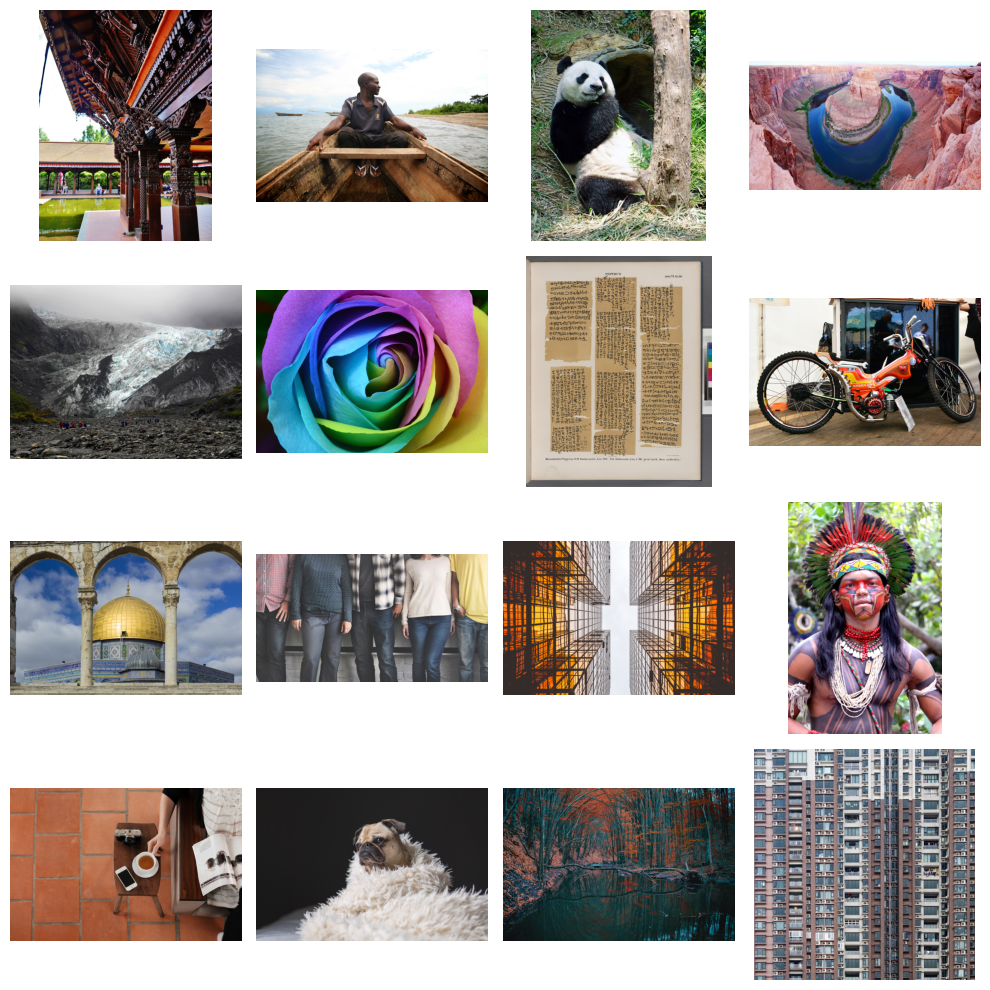

In [ ]:
# Visualizar algunas imágenes

# ...

In [376]:
# Mostrar algunas imágenes aleatorias del dataset

# Dividir en subconjuntos
train_dataset, val_dataset, test_dataset, calibration_dataset = split_dataset(full_dataset)

# Crear DataLoaders
batch_size = 8
num_workers = 2
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=num_workers)
calibration_loader = DataLoader(calibration_dataset, batch_size=batch_size, num_workers=num_workers)

# Mostrar tamaños de los subconjuntos
print(f"Tamaño del dataset de entrenamiento: {len(train_dataset)}")
print(f"Tamaño del dataset de validación: {len(val_dataset)}")
print(f"Tamaño del dataset de prueba: {len(test_dataset)}")
print(f"Tamaño del dataset de calibración: {len(calibration_dataset)}")

# Verificar la primera batch
for batch in train_loader:
    print(f"Tamaño del primer batch - L: {batch['L'].shape}, ab: {batch['ab'].shape}")
    break

Tamaño del dataset de entrenamiento: 540
Tamaño del dataset de validación: 180
Tamaño del dataset de prueba: 90
Tamaño del dataset de calibración: 90
Tamaño del primer batch - L: torch.Size([8, 1, 256, 256]), ab: torch.Size([8, 2, 256, 256])


In [ ]:
# Utils

class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_Huber = AverageMeter()
    loss_G_VGG = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_Huber': loss_G_Huber,
            'loss_G_VGG': loss_G_VGG,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"./training_results/colorization_{int(time.time())}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

def lab_to_rgb_tensor(L, ab):
    """Conversión LAB a RGB diferenciable (corregida)"""
    # Denormalizar
    L = (L + 1.) * 50.  # L: [batch, 1, H, W]
    ab = ab * 110.       # ab: [batch, 2, H, W]
    
    # Convertir LAB a XYZ 
    y = (L + 16.) / 116.
    x = (ab[:, 0, :, :] / 500. + y.squeeze(1)).unsqueeze(1) # Añadir dimensión canal
    z = (y.squeeze(1) - ab[:, 1, :, :] / 200.).unsqueeze(1) # Añadir dimensión canal
    y = y  # y ya tiene dimensión [batch, 1, H, W]
    
    # Stack 
    xyz = torch.cat([x, y, z], dim=1)  # Ahora todos [batch, 1, H, W]
    xyz = torch.clamp(xyz, 0, 1)
    
    # Conversión a RGB
    transform = torch.tensor([
        [3.2406, -1.5372, -0.4986],
        [-0.9689, 1.8758, 0.0415],
        [0.0557, -0.2040, 1.0570]
    ]).to(L.device)
    
    rgb = torch.einsum('bchw,cd->bdhw', xyz, transform) # Suma en notación de Einstein
    rgb = torch.clamp(rgb, 0, 1)
    return rgb

class VGGLoss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.vgg = vgg16(pretrained=True).features[:16].to(device).eval()
        for param in self.vgg.parameters():
            param.requires_grad = False
            
    def forward(self, fake, real):
        # Convertir LAB a RGB
        fake_rgb = lab_to_rgb_tensor(fake[:, :1], fake[:, 1:]) # L: fake[:,:1], ab: fake[:,1:]
        real_rgb = lab_to_rgb_tensor(real[:, :1], real[:, 1:])
        
        # Normalizar para VGG
        fake_rgb = (fake_rgb - 0.5) * 2
        real_rgb = (real_rgb - 0.5) * 2
        
        # Calcular pérdida
        return F.l1_loss(self.vgg(fake_rgb), self.vgg(real_rgb.detach()))

In [378]:
# Bloque generador 

class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

In [379]:
# Bloque discriminador

class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)
    
# Create structure with 3 layers
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

In [380]:
# Clase para la GAN Loss

class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [381]:
# Como recomendación del artículo, inicializamos los pesos del modelo con una media de 0.0 y std_dev de 0.02 (que son los hiperparámetros recomendados)

def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [382]:
# Clase que encapsula todo el entrenamiento (usamos Huber en vez de L1)

class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_Huber=100.0, delta=1.0, lambda_VGG=10.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_Huber = lambda_Huber
        self.delta = delta  # Parámetro de sensibilidad de Huber
        self.lambda_VGG = lambda_VGG

        # Inicialización de redes
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)

        # Criterios de pérdida
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.Hubercriterion = nn.HuberLoss(delta=self.delta)
        self.VGGloss = VGGLoss(self.device)

        # Optimizadores
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)

        # Pérdidas principales
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_Huber = self.Hubercriterion(self.fake_color, self.ab) * self.lambda_Huber 

        # Pérdida VGG 
        combined_fake = torch.cat([self.L, self.fake_color], dim=1)
        combined_real = torch.cat([self.L, self.ab], dim=1)
        self.loss_G_VGG = self.VGGloss(combined_fake, combined_real) * self.lambda_VGG
        
        # Combinación total
        self.loss_G = (self.loss_G_GAN + 
                       self.loss_G_Huber + 
                       self.loss_G_VGG)
        self.loss_G.backward()

    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

model initialized with norm initialization
model initialized with norm initialization


Total Progress:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1/5
Iteration 50/68
loss_D_fake: 0.74934
loss_D_real: 0.74844
loss_D: 0.74889
loss_G_GAN: 0.87805
loss_G_Huber: 0.59804
loss_G_VGG: 0.31786
loss_G: 1.79396


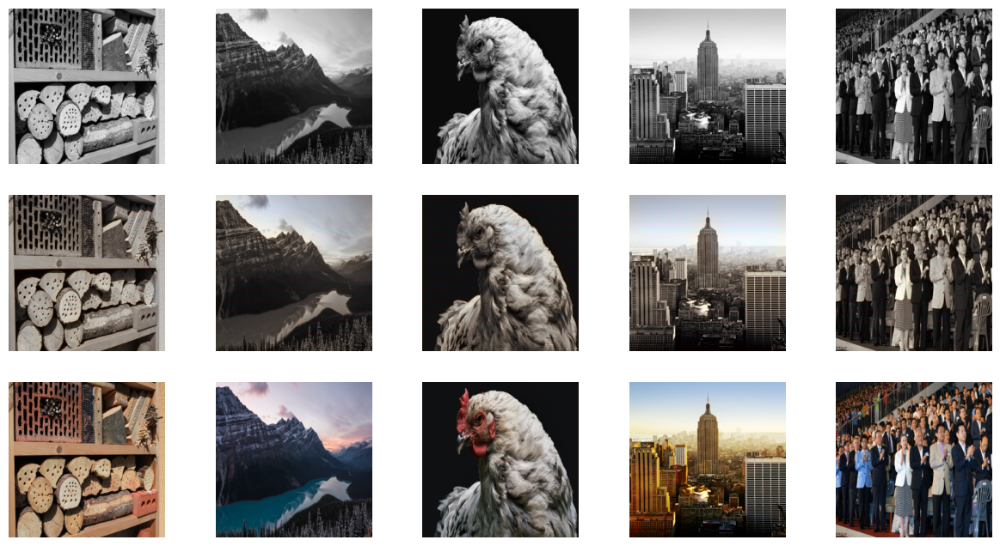

Total Progress:  20%|██        | 1/5 [00:25<01:43, 25.93s/it]


Epoch 2/5
Iteration 100/68
loss_D_fake: 0.65921
loss_D_real: 0.66684
loss_D: 0.66303
loss_G_GAN: 0.84999
loss_G_Huber: 0.58357
loss_G_VGG: 0.26503
loss_G: 1.69859


/tmp/ipykernel_9431/1512984365.py:47: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
/tmp/ipykernel_9431/1512984365.py:47: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 716 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


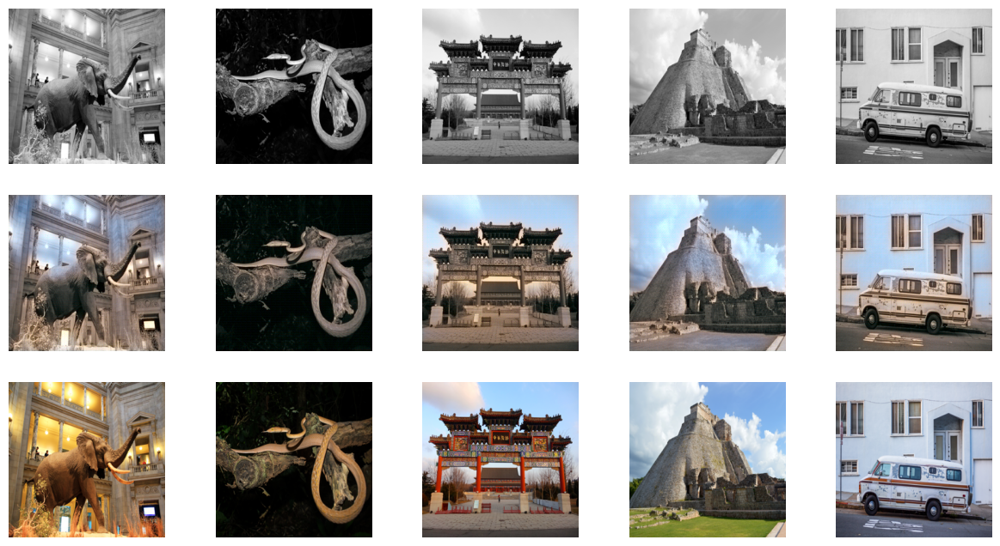

Total Progress:  40%|████      | 2/5 [00:52<01:19, 26.55s/it]


Epoch 3/5
Iteration 150/68
loss_D_fake: 0.65484
loss_D_real: 0.65456
loss_D: 0.65470
loss_G_GAN: 0.87136
loss_G_Huber: 0.57886
loss_G_VGG: 0.26656
loss_G: 1.71678


/tmp/ipykernel_9431/1512984365.py:47: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 10 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


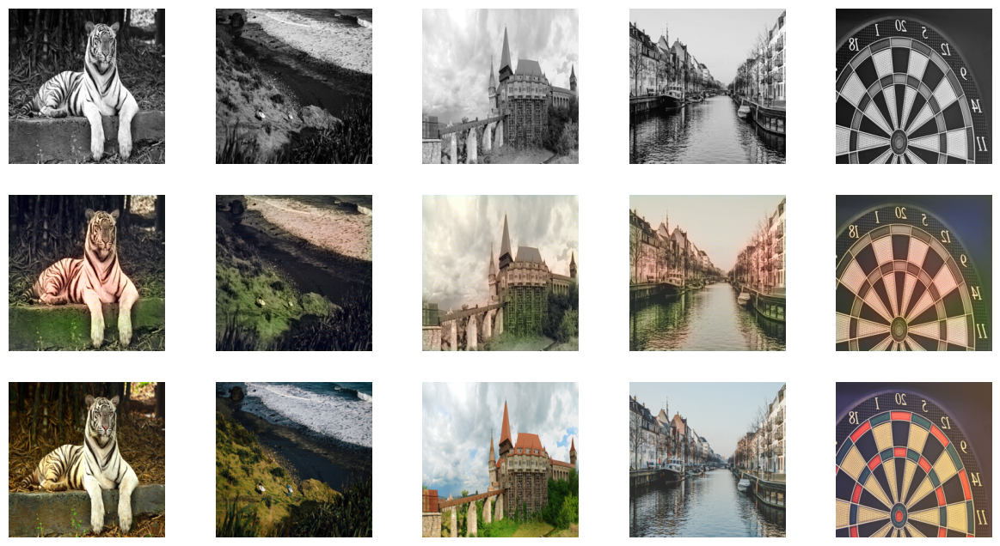


Epoch 3/5
Iteration 200/68
loss_D_fake: 0.67237
loss_D_real: 0.67571
loss_D: 0.67404
loss_G_GAN: 0.82677
loss_G_Huber: 0.56858
loss_G_VGG: 0.25181
loss_G: 1.64716


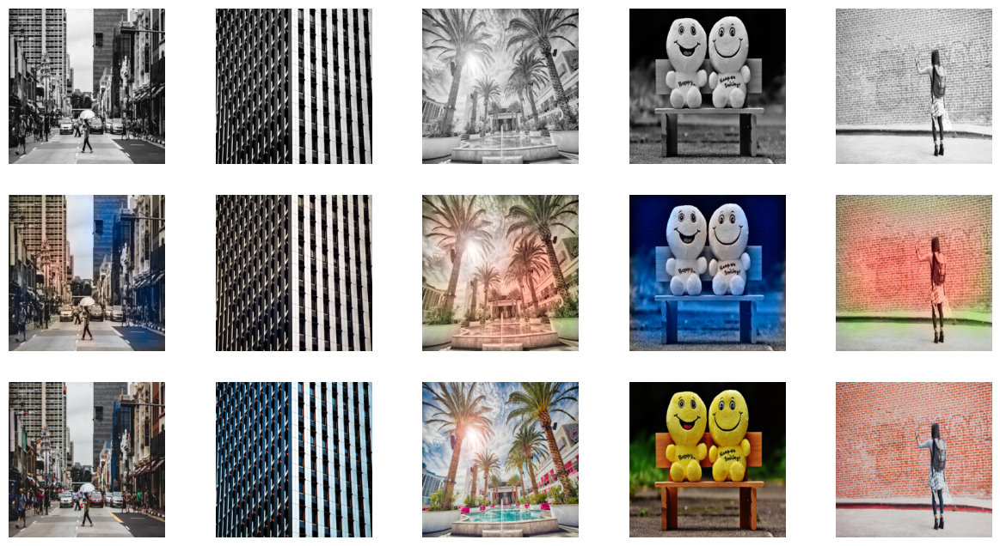

Total Progress:  60%|██████    | 3/5 [01:20<00:54, 27.15s/it]


Epoch 4/5
Iteration 250/68
loss_D_fake: 0.66762
loss_D_real: 0.67660
loss_D: 0.67211
loss_G_GAN: 0.83298
loss_G_Huber: 0.59903
loss_G_VGG: 0.25380
loss_G: 1.68581


/tmp/ipykernel_9431/1512984365.py:47: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


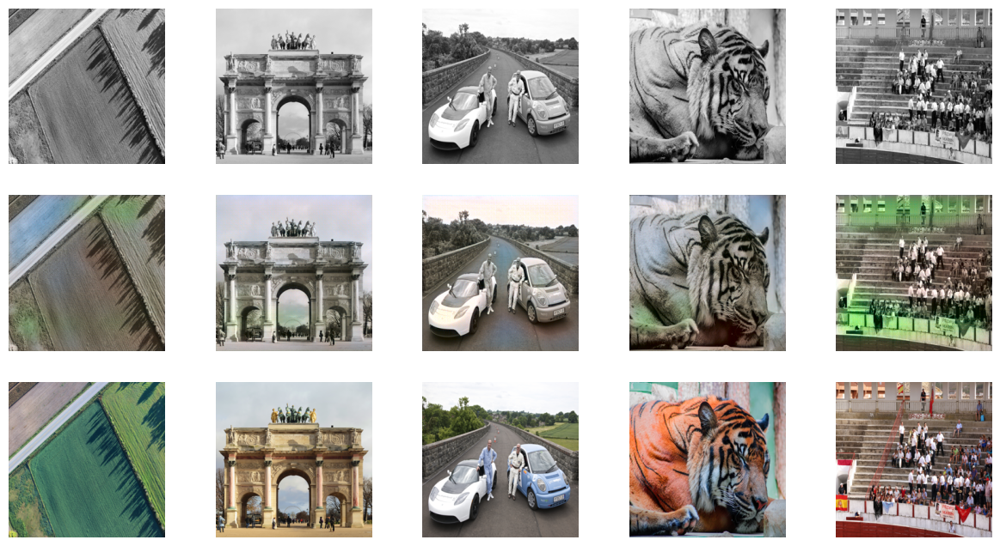

Total Progress:  80%|████████  | 4/5 [01:49<00:27, 27.73s/it]


Epoch 5/5
Iteration 300/68
loss_D_fake: 0.68584
loss_D_real: 0.69784
loss_D: 0.69184
loss_G_GAN: 0.79785
loss_G_Huber: 0.59880
loss_G_VGG: 0.24747
loss_G: 1.64412


/tmp/ipykernel_9431/1512984365.py:47: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 69 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


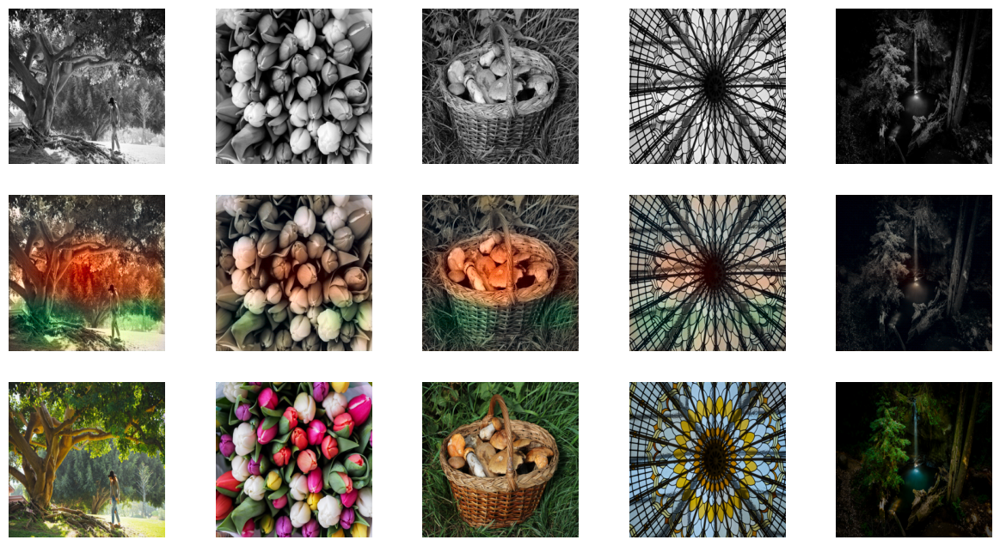

Total Progress: 100%|██████████| 5/5 [02:18<00:00, 27.61s/it]


In [383]:
# Función de entrenamiento

def train_model(model, train_dl, epochs, display_every=200):
    data = next(iter(val_loader)) # getting a batch for visualizing the model output after fixed intrvals
    i = 0                                  # log the losses of the complete network
    for e in tqdm(range(epochs), desc='Total Progress'):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        for data in tqdm(train_dl, desc=f"Epoch Progress"):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=True) # function displaying the model's outputs (de arriba a abajo: gris, colorizada y ground truth)

model = MainModel(lambda_Huber=100.0, delta=0.25, lambda_VGG=1.0)
train_model(model, train_loader, epochs=5, display_every=50)

In [384]:
# Guardar el modelo completo
torch.save(model, './model/modelo_completo.pth')

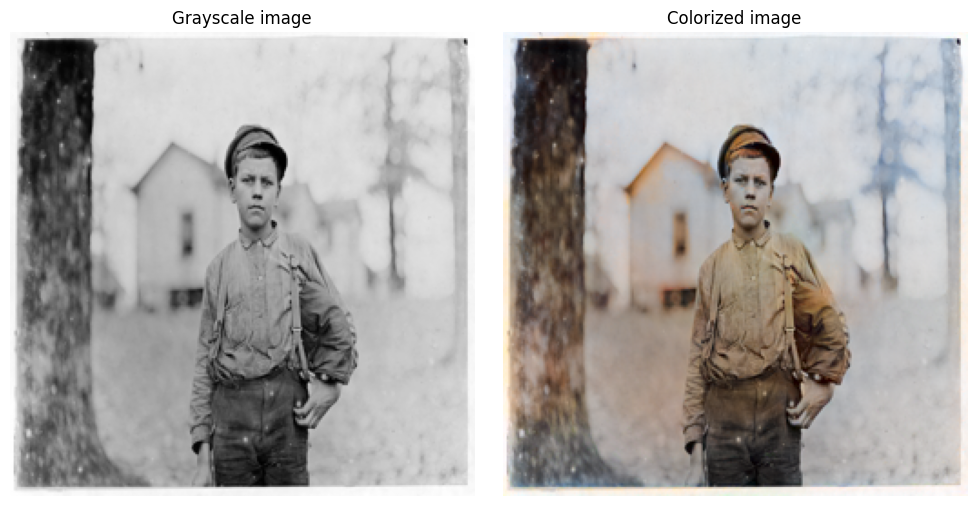

array([[[0.95415074, 0.97624487, 1.        ],
        [0.9511623 , 0.97104496, 0.9801071 ],
        [0.93767   , 0.9714443 , 0.9991335 ],
        ...,
        [0.97202855, 0.9885338 , 1.        ],
        [1.        , 0.97012717, 0.9662277 ],
        [1.        , 0.97257704, 0.93190044]],

       [[0.9507093 , 0.9677418 , 1.        ],
        [0.95179254, 0.96468204, 0.98383874],
        [0.96062165, 0.96574956, 0.9900469 ],
        ...,
        [0.9894878 , 0.9899687 , 0.957987  ],
        [0.9883328 , 0.9845775 , 0.98552996],
        [0.9842902 , 0.99096304, 0.9550689 ]],

       [[0.9359896 , 0.9680466 , 1.        ],
        [0.92644835, 0.964984  , 0.9920779 ],
        [0.9434056 , 0.960756  , 0.9892828 ],
        ...,
        [0.98858184, 0.990138  , 0.9660515 ],
        [0.97962636, 0.98859996, 0.96766466],
        [0.93438375, 1.        , 0.98045737]],

       ...,

       [[1.        , 0.9797612 , 0.9341444 ],
        [1.        , 0.9681898 , 0.87967527],
        [1.        , 0

In [422]:
# Testear en línea

def colorize_and_visualize(model_path, input_image_path):
    # 1. Cargar el modelo
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = torch.load(model_path, map_location=device, weights_only=False)
    model.eval()
    # 2. Preprocesar la imagen de entrada
    SIZE = 256
    
    # Cargar y transformar la imagen
    input_image = Image.open(input_image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((SIZE, SIZE), Image.BICUBIC),
        transforms.ToTensor(),
    ])
    img_tensor = transform(input_image)
    
    # Convertir a LAB como en tu Dataset
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_lab = rgb2lab(img_np).astype("float32")
    img_lab = transforms.ToTensor()(img_lab)
    
    # Procesar canales LAB
    L = img_lab[0:1, ...] / 50. - 1.  # Normalizar L
    L = L.unsqueeze(0).to(device)      # Añadir dimensión batch
    
    # 3. Pasar por el modelo
    with torch.no_grad():
        fake_color = model.net_G(L)
    
    # 4. Postprocesar la salida
    # Combinar L original con ab predicho
    fake_img_lab = torch.cat([L*50. + 50., fake_color*110.], dim=1)
    fake_img_lab = fake_img_lab.squeeze(0).permute(1, 2, 0).cpu().numpy()
    fake_img = lab2rgb(fake_img_lab)
    
    # Mostrar la imagen original en escala de grises y la imagen generada
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    # Imagen original en escala de grises (canal L)
    ax[0].imshow(L.squeeze().cpu(), cmap='gray')
    ax[0].set_title("Grayscale image")
    ax[0].axis("off")
    
    # Imagen coloreada
    ax[1].imshow(fake_img)
    ax[1].set_title("Colorized image")
    ax[1].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    return fake_img
    
path_imagen = '/home/alejandro/Imágenes/Lewis_Hine,_Archie_Love,_mill_worker,_14_years_old,_Chester,_South_Carolina,_1908.jpg'
model_path = '/opt/image-colorization-exploration/src/dl/model/modelo_completo_500epoch.pth'
colorize_and_visualize(model_path, path_imagen)